In [87]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
from scipy import stats

import sqlite3

import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import statsmodels.api as sm


import warnings
warnings.filterwarnings("ignore")

In [3]:
#on se connecte à la db
conn = sqlite3.connect("ligue_1_final.sqlite3")
curs = conn.cursor()

# Données de cadrage
## Objectif : 
Identifier la relation entre la météo et le dynamisme d'un match, afin de cibler au mieux les dépenses publicitaires.

## Périmètre de l'étude :
- Championnat de ligue 1 2020-2021
- 20 équipes, 38 journées de rencontres pour un total de 380 matches
- Météo résumée par la pluviométrie et la température moyenne de la journée


Rappel de la commande :
- l’évolution du nombre de buts d’une équipe en fonction de la météo (pluviométrie, température)
- l’évolution du nombre de buts d’un joueur en fonction de la météo (pluviométrie, température)
- Toutes propositions permettant d’illustrer au mieux la relation entre météo et le dynamisme d’un match.

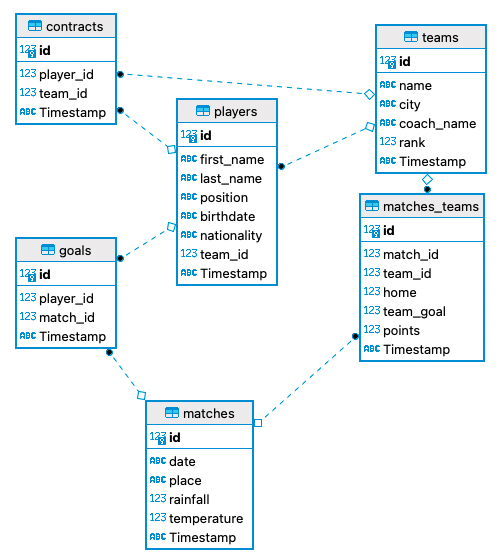

## Distribution des buts

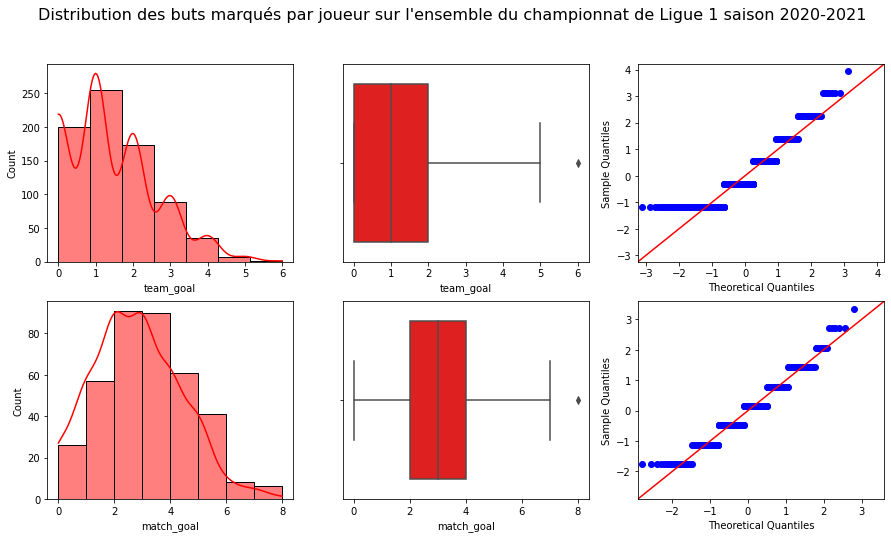

In [95]:
df = pd.read_sql_query("SELECT match_id, team_goal FROM matches_teams;", conn)
df_2 = pd.read_sql_query("SELECT match_id, SUM(team_goal) AS match_goal FROM matches_teams GROUP BY match_id", conn)

fig, ax = plt.subplots(ncols=3,nrows = 2)
fig.set_size_inches(15, 8)

fig.suptitle("Distribution des buts marqués par joueur sur l\'ensemble du championnat de Ligue 1 saison 2020-2021", fontsize=16)
sns.histplot(data=df, x="team_goal", bins=7, kde=True, color = 'red', ax=ax[0,0])
sns.boxplot(data=df, x="team_goal", color='red', ax=ax[0,1])
sm.qqplot(df['team_goal'], stats.t, fit=True, line="45",ax=ax[0,2])


fig.suptitle('Distribution des buts marqués par joueur sur l\'ensemble du championnat de Ligue 1 saison 2020-2021', fontsize=16)
sns.histplot(data=df_2, x="match_goal", bins=8, kde=True, color = 'red',ax=ax[1,0])
sns.boxplot(data=df_2, x="match_goal", color='red',ax=ax[1,1])
sm.qqplot(df_2['match_goal'], stats.t, fit=True, line="45", ax=ax[1,2])



plt.show()

In [4]:
## TO DO :

# 20 équipes, 38 journées de rencontres pour un total de 380 matches ==> graphes ?
# XX buts marqués (nombre moyen de buts par match + min et max
# Meilleurs buteurs (top 10)
# Meilleurs équipes en nombre de buts (top 5)

# Etude des relations météo - équipes
## En résumé :
- Une légère relation entre les performances des équipes et le nieau de pluie est identifiée. Etonamment, le nombre de buts tend à s'accroitre très légèrement avec la pluie. Néanmoins il est nécessaire de disposer de davantage de données pour confirmer cette tendance, qui apparaît comme très légère et non robuste.
- Présomption de relation entre les buts moyens marqués par équipe en fonction de la température. Une relation globale en cloche a été identifée (les températures extrêmes semblent défavoriser le dynamisme des matchs). Cette relation est à prendre avec précaution compte tenu du faible nombre d'observations. Si l'on s'intéresse individuellement aux performances des équipes, il est par ailleurs compliqué de dégager une tendance.

## Analyse équipes-pluviométrie :

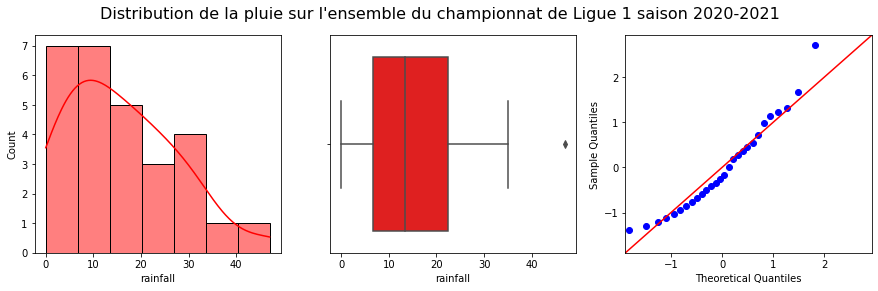

In [88]:
df_4 = pd.read_sql_query("SELECT rainfall, COUNT(*) FROM matches GROUP BY rainfall", conn)

fig, ax = plt.subplots(ncols=3)
fig.set_size_inches(15, 4)

fig.suptitle('Distribution de la pluie sur l\'ensemble du championnat de Ligue 1 saison 2020-2021', fontsize=16)
sns.histplot(data=df_4, x="rainfall", bins=7, kde=True, color = 'red', ax=ax[0])
sns.boxplot(data=df_4, x="rainfall", color='red', ax=ax[1])
sm.qqplot(df_4['rainfall'], stats.t, fit=True, line="45", ax=ax[2])

plt.show()

In [5]:
# nombre total et moyen de buts en fonction de la température
df_team_meteo = pd.read_sql_query("""SELECT matches.id as matches_id, home, date, temperature, rainfall, team_goal, teams.city AS team
                        FROM matches
                        JOIN matches_teams
                        ON matches.id = matches_teams.match_id
                        JOIN teams
                        ON matches_teams.team_id = teams.id""",
                       conn)
# une ligne par match et équipe
df_team_no_rain = df_team_meteo[df_team_meteo["rainfall"] == 0]
df_team_rain = df_team_meteo[df_team_meteo["rainfall"] != 0]
df_team_meteo["rain"] = df_team_meteo["rainfall"].apply(lambda x:0 if x == 0 else 1)
df_team_meteo["goal"] = df_team_meteo["team_goal"].apply(lambda x:0 if x == 0 else 1)
# une ligne par match.
df_match_meteo = df_team_meteo.groupby(by="matches_id").sum()
#df_match_meteo["goal"] = df_match_meteo["goal"].apply(lambda x:0 if x == 0 else 1)

In [6]:
df_match_meteo

,home,temperature,rainfall,team_goal,rain,goal
matches_id,,,,,,
589,1,43.0,40.0,5,2,2
590,1,28.0,8.0,3,2,2
591,1,33.0,2.0,2,2,1
592,1,30.0,4.0,1,2,1
593,1,28.0,2.0,3,2,2
594,1,28.0,2.0,2,2,1
595,1,27.0,2.0,2,2,1
596,1,34.0,2.0,1,2,1
597,1,29.0,2.0,5,2,2


### Première approche sans traitement préalable des données

In [7]:
# TO DO : mettre plot distribution de la pluviométrie 

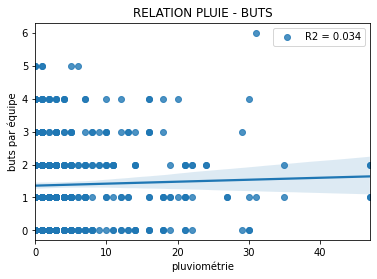

In [8]:


slope, intercept, r_value, pv, se = stats.linregress(df_team_meteo['rainfall'],df_team_meteo['team_goal'])
        
sns.regplot(x="rainfall", y="team_goal", data=df_team_meteo, label=f"R2 = {r_value.round(3)}").legend(loc="best")
plt.title("RELATION PLUIE - BUTS")
plt.xlabel("pluviométrie")
plt.ylabel("buts par équipe");

A première vue pas de relation visible entre la pluie et les performances des équipes.

Voyons si le fait de distinguer la présence ou l'absence de pluie peut révéler des informations 

### Seconde approche : création de 2 classes pour la pluviométrie (présence ou absence de pluie)

In [9]:
df_match_meteo.groupby(by="rain")["team_goal"].describe()

,count,mean,std,min,25%,50%,75%,max
rain,,,,,,,,
0,148.0,2.756757,1.684752,0.0,1.75,3.0,4.0,8.0
2,232.0,2.762931,1.494523,0.0,2.00,3.0,4.0,7.0


In [10]:
# répartition des matches selon la pluie et le nombre de buts
match_pluie = pd.DataFrame(df_match_meteo.groupby(by="rain")["team_goal"].value_counts())
match_pluie = match_pluie.rename({"team_goal" : "nombre_matches"}, axis=1)
match_pluie = match_pluie.reset_index()
match_pluie["rain"] = match_pluie["rain"].apply(lambda x:0 if x==0 else 1)

# ajout d'une colonne % au dataframe
percent_col =[]
no_rain_sum = 0
rain_sum = 0
# calcul de la somme pour pluie / non pluie
for row in range(match_pluie.shape[0]):
    if match_pluie.loc[row,"rain"] == 0:
        no_rain_sum += match_pluie.loc[row,"nombre_matches"]
    else:
        rain_sum += match_pluie.loc[row,"nombre_matches"]
# calcul des % de matches
for row in range(match_pluie.shape[0]):
    if match_pluie.loc[row,"rain"] == 0:
        percent_col.append(np.round((match_pluie.loc[row,"nombre_matches"]/no_rain_sum*100),2))
    else:
        percent_col.append(np.round((match_pluie.loc[row,"nombre_matches"]/rain_sum*100),2))
# ajout de la colonne au dataframe
match_pluie["percent_matches"] = percent_col

# création d'un df par modalité "rain"
match_rain = match_pluie[match_pluie["rain"] == 0]
match_no_rain = match_pluie[match_pluie["rain"] == 1]

In [11]:
df_match_meteo

,home,temperature,rainfall,team_goal,rain,goal
matches_id,,,,,,
589,1,43.0,40.0,5,2,2
590,1,28.0,8.0,3,2,2
591,1,33.0,2.0,2,2,1
592,1,30.0,4.0,1,2,1
593,1,28.0,2.0,3,2,2
594,1,28.0,2.0,2,2,1
595,1,27.0,2.0,2,2,1
596,1,34.0,2.0,1,2,1
597,1,29.0,2.0,5,2,2


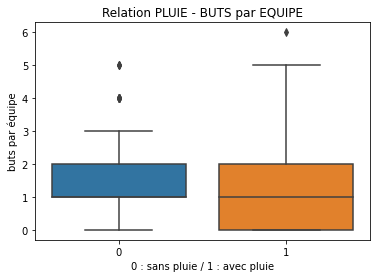

In [13]:
plt.figure()
sns.boxplot(y="team_goal", x="rain", data=df_team_meteo)
plt.title("Relation PLUIE - BUTS par EQUIPE")
plt.xlabel("0 : sans pluie / 1 : avec pluie")
plt.ylabel("buts par équipe");

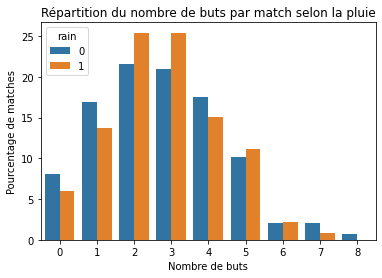

In [12]:
# distribution du nombre de buts selon la pluie
plt.figure()
sns.barplot(x=match_pluie["team_goal"],y=match_pluie["percent_matches"], hue=match_pluie["rain"])
plt.title("Répartition du nombre de buts par match selon la pluie")
plt.xlabel("Nombre de buts")
plt.ylabel("Pourcentage de matches")
plt.show()

### Troisième approche : création de davantage de classes pour la pluie, et régression sur les moyennes

In [20]:
# création de classes pour la pluie
df_team_meteo['rainfall_classe'] = pd.cut(df_team_meteo['rainfall'], [0, 1, 5, 10, 20, np.inf])
df_team_meteo['rainfall_classe_detailed'] = pd.cut(df_team_meteo['rainfall'], [0, 1, 2,3, 4, 5, 6, 7,8, 10, 12, 14, 18, 22, 30, np.inf])

# création d'un df groupant par classes le nombre de buts moyens
df_by_detailed_rain = df_team_meteo.groupby(by='rainfall_classe_detailed')
df_by_detailed_rain_mean = df_by_detailed_rain.mean()
df_by_detailed_rain_mean = df_by_detailed_rain_mean.reset_index()
df_by_detailed_rain_mean = df_by_detailed_rain_mean.reset_index()
df_by_detailed_rain_mean = df_by_detailed_rain_mean.rename({"index":"rainfall_category"}, axis=1)
df_by_detailed_rain_mean

,rainfall_category,rainfall_classe_detailed,matches_id,home,temperature,rainfall,team_goal,rain,goal
0,0,"(0.0, 1.0]",794.348837,0.5,10.837209,1.000000,1.343023,1.0,0.738372
1,1,"(1.0, 2.0]",753.862069,0.5,10.258621,2.000000,1.258621,1.0,0.706897
2,2,"(2.0, 3.0]",809.500000,0.5,10.400000,3.000000,1.550000,1.0,0.750000
3,3,"(3.0, 4.0]",725.800000,0.5,11.000000,4.000000,1.366667,1.0,0.733333
4,4,"(4.0, 5.0]",789.200000,0.5,12.133333,5.000000,1.333333,1.0,0.700000
5,5,"(5.0, 6.0]",761.400000,0.5,8.300000,6.000000,1.100000,1.0,0.500000
6,6,"(6.0, 7.0]",799.444444,0.5,11.333333,7.000000,1.388889,1.0,0.722222
7,7,"(7.0, 8.0]",742.000000,0.5,8.000000,8.000000,1.100000,1.0,0.500000
8,8,"(8.0, 10.0]",772.142857,0.5,10.785714,9.714286,2.000000,1.0,0.857143
9,9,"(10.0, 12.0]",797.000000,0.5,10.071429,11.428571,1.428571,1.0,0.714286


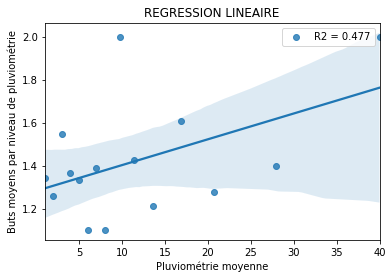

In [21]:
from scipy import stats
        
slope, intercept, r_value, pv, se = stats.linregress(df_by_detailed_rain_mean['rainfall'],df_by_detailed_rain_mean['team_goal'])
        
sns.regplot(x="rainfall", y="team_goal", data=df_by_detailed_rain_mean, label=f"R2 = {r_value.round(3)}").legend(loc="best")
plt.title("REGRESSION LINEAIRE")
plt.ylabel("Buts moyens par niveau de pluviométrie")
plt.xlabel("Pluviométrie moyenne")
plt.show()

In [22]:
# voir avec Jo comment expliquer la différence de R2 entre statsmodel et scipy ?
import statsmodels.formula.api as smf

results = smf.ols('team_goal ~ rainfall', data=df_by_detailed_rain_mean).fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:              team_goal   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.168
Method:                 Least Squares   F-statistic:                     3.832
Date:                Wed, 28 Jul 2021   Prob (F-statistic):             0.0721
Time:                        09:30:36   Log-Likelihood:                0.69137
No. Observations:                  15   AIC:                             2.617
Df Residuals:                      13   BIC:                             4.033
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.2837      0.096     13.311      0.0

/Users/marie/.pyenv/versions/3.9.5/envs/simplon/lib/python3.9/site-packages/scipy/stats/stats.py:1541: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


**Concernant le niveau de pluie, on retient que :**
- Lorsqu'il pleut, on constate que la dispersion du nombre de buts est plus importante (on peut s'attendre à tout)
- Quand il ne pleut pas, la proportion de matchs avec 0 ou 1 buts est légèrement plus importante
- A contrario quand il pleut, la proportion de matchs avec 2 ou 3 buts est plus importante
- Lorsqu'on crée différentes classes selon le degré de pluviométrie, on peut parvenir à des relations entre la pluviométrie moyenne et le nombre moyen de buts marqués par équipe et par match. On remarque que, plus le nombre de classes diminue (et donc plus le nombre d'observations se réduit), plus le R2 est important. Ce constat interroge sur la robustesse de la relation.

## Analyse équipes - température

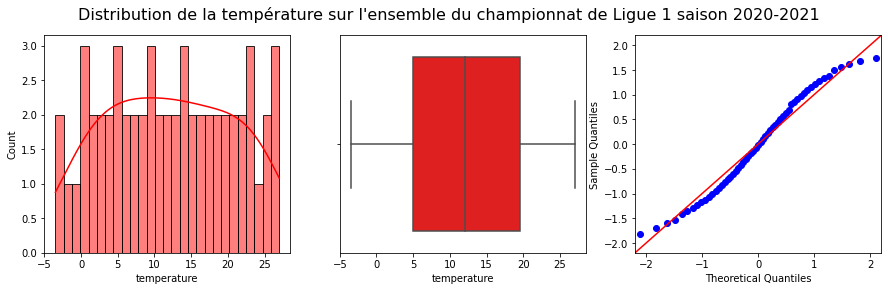

In [90]:
df_5 = pd.read_sql_query("SELECT temperature FROM matches GROUP BY temperature", conn)

fig, ax = plt.subplots(ncols=3)
fig.set_size_inches(15, 4)

fig.suptitle('Distribution de la température sur l\'ensemble du championnat de Ligue 1 saison 2020-2021', fontsize=16)
sns.histplot(data=df_5, x="temperature", bins=27, kde=True, color = 'red', ax=ax[0])
sns.boxplot(data=df_5, x="temperature", color='red', ax=ax[1])
sm.qqplot(df_5['temperature'], stats.t, fit=True, line="45", ax=ax[2])

plt.show()

### Analyse de la moyenne des buts marqués selon les températures

#### Analyse de la relation

In [24]:
df_team_meteo['temperature_classe'] = pd.cut(df_team_meteo['temperature'], [-3.5,-1.5,1.5,3.5,5.5,7.5,9.5,11.5,13.5,15.5,17.5,19.5,21.5,23.5,25.5,27])

In [25]:
df_by_detailed_temp = df_team_meteo.groupby(by='temperature_classe')
df_by_detailed_temp_mean = df_by_detailed_temp.mean()
df_by_detailed_temp_mean = df_by_detailed_temp_mean.reset_index()
df_by_detailed_temp_mean = df_by_detailed_temp_mean.reset_index()
df_by_detailed_temp_mean = df_by_detailed_temp_mean.rename({"index":"temperature_category"}, axis=1)

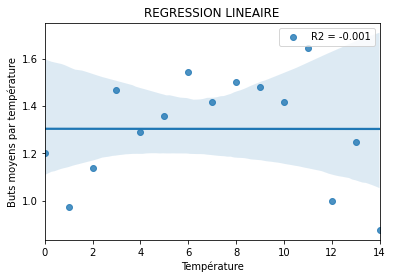

In [26]:
from scipy import stats
        
slope, intercept, r_value, pv, se = stats.linregress(df_by_detailed_temp_mean['temperature_category'],df_by_detailed_temp_mean['team_goal'])
        
sns.regplot(x="temperature_category", y="team_goal", data=df_by_detailed_temp_mean, label=f"R2 = {r_value.round(3)}").legend(loc="best")
plt.title("REGRESSION LINEAIRE")
plt.ylabel("Buts moyens par température")
plt.xlabel("Température")
plt.show()

On voit clairement que, s'il semble y avoir une relation entre les deux variables (les températures et la moyenne des buts par match et par équipe), elle n'est pas linéaire mais plutôt ploynomiale de degré 2. 

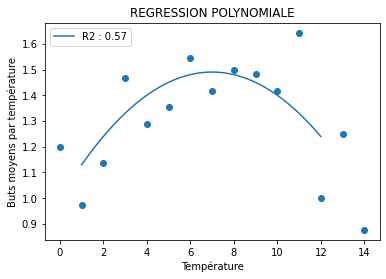

In [27]:
import numpy
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

x = df_by_detailed_temp_mean["temperature_category"]
y = df_by_detailed_temp_mean["team_goal"]

poly_reg = numpy.poly1d(numpy.polyfit(x, y, 2))

r2 = r2_score(y, poly_reg(x))
myline = numpy.linspace(1, 12, 100)

plt.scatter(x, y)
plt.plot(myline, poly_reg(myline))
plt.legend([f"R2 : {np.round(r2,2)}"])
plt.title("REGRESSION POLYNOMIALE")
plt.ylabel("Buts moyens par température")
plt.xlabel("Température")
plt.show()

#### Régression polynomiale

In [28]:
import statsmodels.formula.api as smf

results = smf.ols('team_goal ~ temperature_category + I(temperature_category**2)', data=df_by_detailed_temp_mean).fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:              team_goal   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.498
Method:                 Least Squares   F-statistic:                     7.949
Date:                Wed, 28 Jul 2021   Prob (F-statistic):            0.00633
Time:                        09:30:49   Log-Likelihood:                 7.7685
No. Observations:                  15   AIC:                            -9.537
Df Residuals:                      12   BIC:                            -7.413
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

/Users/marie/.pyenv/versions/3.9.5/envs/simplon/lib/python3.9/site-packages/scipy/stats/stats.py:1541: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


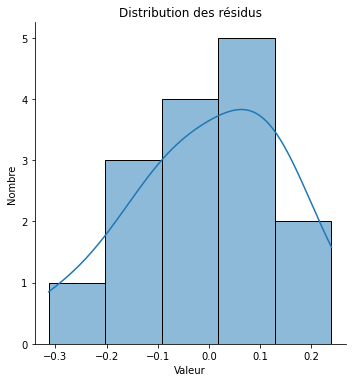

In [29]:
# Calcul des résidus
y_hat = results.predict(df_by_detailed_temp_mean[["team_goal","temperature_category"]]) # on calcule les y prédits 
residus = y_hat - df_by_detailed_temp_mean["team_goal"] # les résidus : différence entre la valeur déterminée par le modèle et la vraie valeur
# Distribution des résidus (histogramme)
sns.displot(data=residus, kde=True);
plt.title("Distribution des résidus")
plt.ylabel("Nombre")
plt.xlabel("Valeur")
plt.show()

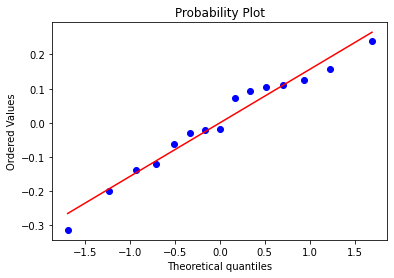

In [30]:
# Distribution des résidus (qqplot)
import pylab 
import scipy.stats as stats

stats.probplot(residus, dist="norm", plot=pylab)
pylab.show()

**Conclusion** 
Relation à confirmer avec davantage de données

### Analyse de la moyenne des buts marqués selon les températures, en fonction des équipes

In [31]:
# création d'une double indexation par équipe et température afin d'affiner l'analyse
df_by_temperature_team_detail = df_team_meteo.groupby(by=['temperature_classe', "team"])

# Création d'une colonne d'encodage ordinal pour les classes de température, afin de pouvoir faire des régressions
df_by_temperature_team_detail_mean = df_by_temperature_team_detail.mean()
df_by_temperature_team_detail_mean = df_by_temperature_team_detail_mean.reset_index().reset_index()

col_temp = []
j = 0
for row in range(df_by_temperature_team_detail_mean.shape[0]//20):
    i = 0
    j+=1
    for i in range(20):
        col_temp.append(j)
        i+=1 
        
df_by_temperature_team_detail_mean["temp"] = col_temp
df_by_temperature_team_detail_mean

# copie du dataframe et suppression des lignes sans valeur
df = df_by_temperature_team_detail_mean.copy()
df = df.dropna()

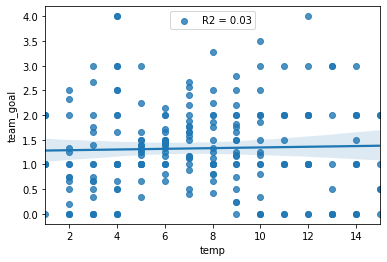

In [32]:
from scipy import stats
        
slope, intercept, r_value, pv, se = stats.linregress(df['temp'],df['team_goal'])
        
sns.regplot(x="temp", y="team_goal", data=df, label=f"R2 = {r_value.round(3)}").legend(loc="best")

**Conclusion** : 
Lien température - buts : pas de lien quand on cumule le détail des équipes, que ce soit en régression linéaire (R2=0.03) ou du second degré (R2 de 0.02)

**Etape suivante** :
Lorsqu'on se penche sur les relations par équipes, on observe des relations de nature différente selon les villes (relation linéaire positive, négative, absence de relation). Les régressions réalisées sur chacune des équipes ne font apparaitre aucune relation robuste, hormis pour l'équipe de Saint-Etienne (relation linéaire positive avec un R2 de 0.76). 

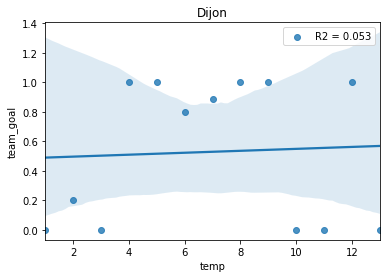

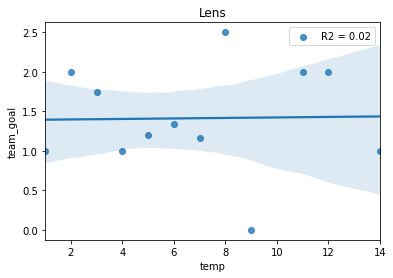

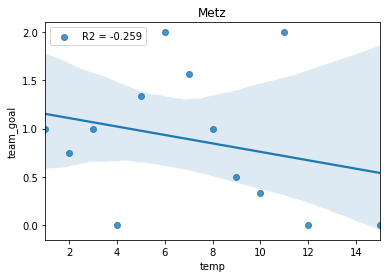

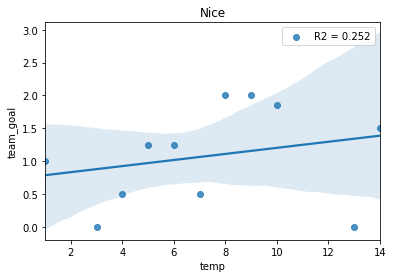

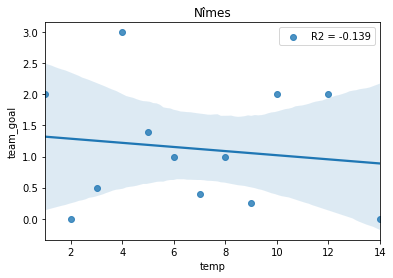

...

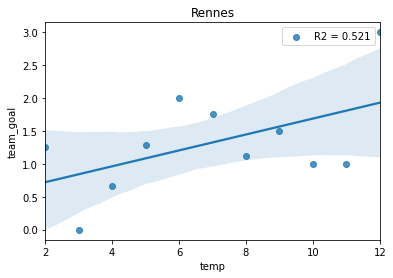

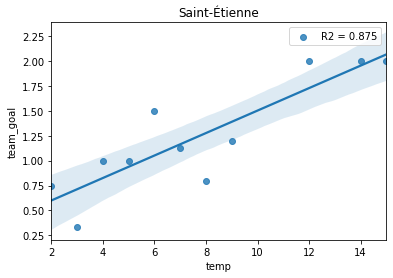

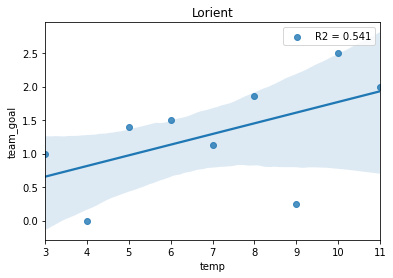

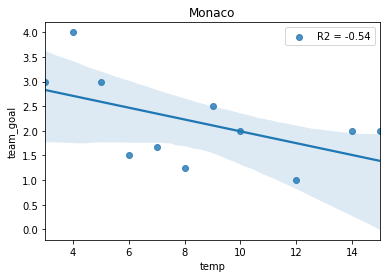

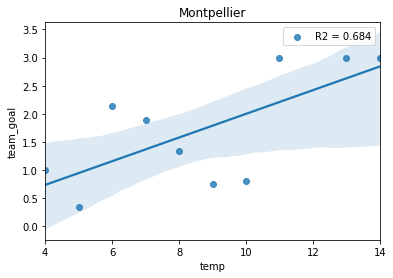

In [33]:
from scipy import stats
teams = df["team"].unique()
for team in teams:
    df_team = df[df["team"] == team]
    plt.figure()
    plt.title(team)
    slope, intercept, r_value, pv, se = stats.linregress(df_team['temp'],df_team['team_goal'])    
    sns.regplot(x="temp", y="team_goal", data=df_team, label=f"R2 = {r_value.round(3)}").legend(loc="best")

**Quand on regarde par équipe, il semble y avoir des relations, de nature différente selon les villes.
**Comme nous avons peu d'observations (20 points au mieux par équipe, il est difficile d'en tirer des conclusions définitives. Il faudrait refaire les statistiques sur plusieurs années ?**

**Relation du premier degré :**
- Saint-Etienne : on a un R2 de 0.875 en linéaire (0.765 avec smf)
- Montpelier : R2 de 0.684 en linéaire (0.468 avec smf)
- Brest : on a un R2 de 0.594 en linéaire / seulement 0.35 avec StatsModel !
- Lorient : on a un R2 de 0.541 en linéaire

- Bordeaux : on a un R2 de -0.4 en linéaire (0.16 avec smf)
- Monaco : R2 de -0.54 en linéaire (0.29 avec smf)

**Second degré ? Testons une régression sur quelques équipes qui sortent du lot :**
- Dijon, Metz, Nice, Reims, Lyon, Marseille, Nantes, Rennes, 
- Dijon : 0.4 
- Metz : 0.2
- Nice : 0.18
- Reims : 0.03
- Lyon : 0.17
- Marseille : 0.19
- Nantes : 0.2
- Rennes : 0.28

**Après vérification, une relation linéaire est identifiée seulement avec l'équipe de Saint-Etienne**

In [34]:
import statsmodels.formula.api as smf

#model = 'act_hours ~ h_hours + I(h_hours**2)'
#hours_model = smf.ols(formula = model, data = df)
data = df[df["team"] == "Saint-Étienne"]
# Fit regression model (using the natural log of one of the regressors)
results = smf.ols('team_goal ~ temp', data=data).fit()

# Inspect the results
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:              team_goal   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.739
Method:                 Least Squares   F-statistic:                     29.36
Date:                Wed, 28 Jul 2021   Prob (F-statistic):           0.000423
Time:                        09:31:15   Log-Likelihood:               -0.81910
No. Observations:                  11   AIC:                             5.638
Df Residuals:                       9   BIC:                             6.434
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3758      0.183      2.058      0.0

/Users/marie/.pyenv/versions/3.9.5/envs/simplon/lib/python3.9/site-packages/scipy/stats/stats.py:1541: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


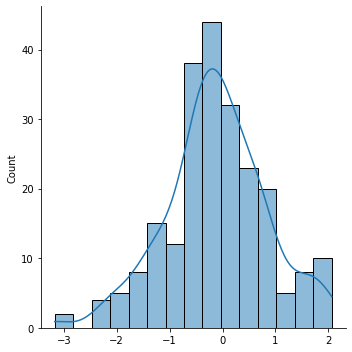

In [35]:
# Calcul des résidus
y_hat = results.predict(df[["team_goal","temp"]]) # on calcule les y prédits 
residus = y_hat - df["team_goal"] # les résidus : différence entre la valeur déterminée par le modèle et la vraie valeur
# Distribution des résidus (histogramme)
print(sns.displot(data=residus, kde=True))

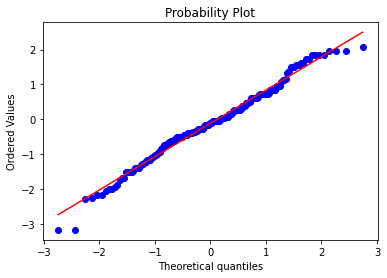

In [36]:
# Distribution des résidus (qqplot)
import pylab 
import scipy.stats as stats


stats.probplot(residus, dist="norm", plot=pylab)
pylab.show()

# Etude des relations météo - joueurs

In [37]:
# 1 ligne = 1 but = 1 joueur = 1 température

df_player_meteo = pd.read_sql_query("""SELECT matches.id as matches_id, date, temperature, rainfall, players.id as players_id, players.last_name, players.position, players.birthdate, players.nationality
                        FROM matches
                        JOIN goals
                        ON matches.id = goals.match_id
                        JOIN players
                        ON goals.player_id = players.id""",
                                    conn)

df_player_meteo.head(10)

,matches_id,date,temperature,rainfall,players_id,last_name,position,birthdate,nationality
0,589,2020-08-28 00:00:00,21.5,20.0,210,M. Depay,Att.,13/02/94,HOL
1,589,2020-08-28 00:00:00,21.5,20.0,606,W. Lautoa,Déf.,25/08/87,FRA
2,589,2020-08-28 00:00:00,21.5,20.0,210,M. Depay,Att.,13/02/94,HOL
3,589,2020-08-28 00:00:00,21.5,20.0,210,M. Depay,Att.,13/02/94,HOL
4,589,2020-08-28 00:00:00,21.5,20.0,630,A. Scheidler,Att.,04/06/98,FRA
5,590,2020-08-29 00:00:00,14.0,4.0,321,D. Le Tallec,Mil.,19/04/90,FRA
6,590,2020-08-29 00:00:00,14.0,4.0,513,E. Camavinga,Mil.,10/11/02,FRA
7,590,2020-08-29 00:00:00,14.0,4.0,329,G. Laborde,Att.,3/05/94,FRA
8,591,2020-08-29 00:00:00,16.5,1.0,390,K. Dolberg,Att.,6/10/97,DAN
9,591,2020-08-29 00:00:00,16.5,1.0,390,K. Dolberg,Att.,6/10/97,DAN


In [38]:
# group by matches_id et players_id ==> donne le nombre de buts par joueur et par match

df_player2_meteo = pd.read_sql_query("""SELECT matches.id as matches_id, date, temperature, rainfall, COUNT(goals.id) as goals_number, players.id as players_id, players.last_name, players.position, players.birthdate, players.nationality
                        FROM matches
                        JOIN goals
                        ON matches.id = goals.match_id
                        JOIN players
                        ON goals.player_id = players.id
                        GROUP BY matches_id, players_id""",
                                    conn)
df_player2_meteo.head(10)

,matches_id,date,temperature,rainfall,goals_number,players_id,last_name,position,birthdate,nationality
0,589,2020-08-28 00:00:00,21.5,20.0,3,210,M. Depay,Att.,13/02/94,HOL
1,589,2020-08-28 00:00:00,21.5,20.0,1,606,W. Lautoa,Déf.,25/08/87,FRA
2,589,2020-08-28 00:00:00,21.5,20.0,1,630,A. Scheidler,Att.,04/06/98,FRA
3,590,2020-08-29 00:00:00,14.0,4.0,1,321,D. Le Tallec,Mil.,19/04/90,FRA
4,590,2020-08-29 00:00:00,14.0,4.0,1,329,G. Laborde,Att.,3/05/94,FRA
5,590,2020-08-29 00:00:00,14.0,4.0,1,513,E. Camavinga,Mil.,10/11/02,FRA
6,591,2020-08-29 00:00:00,16.5,1.0,2,390,K. Dolberg,Att.,6/10/97,DAN
7,592,2020-08-30 00:00:00,15.0,2.0,1,141,J. Bamba,Mil.,26/03/96,FRA
8,593,2020-08-30 00:00:00,14.0,1.0,1,341,A. Girotto,Déf.,17/02/92,BRE
9,593,2020-08-30 00:00:00,14.0,1.0,1,351,I. Louza,Mil.,1/05/99,FRA


In [39]:
# Le nombre maximum de buts marqués par match pour 1 joueur est 3. 
# On note une forte disparité des valeurs de cette modalité => faire des classes pour rééquilibrer

df_player2_meteo["goals_number"].value_counts()

1    866
2     81
3      7
Name: goals_number, dtype: int64

In [40]:
# Top 20 des meilleurs buteurs de la L1
df_player_meteo["last_name"].value_counts().head(20)

K. Mbappé         27
W. Ben Yedder     20
M. Depay          20
K. Volland        16
B. Yilmaz         16
G. Laborde        16
L. Ajorque        16
A. Delort         15
B. Dia            14
T. Moffi          14
K. Toko Ekambi    14
M. Kean           13
J. David          13
A. Gouiri         12
U. Hwang          12
R. Ripart         11
G. Kakuta         11
L. Blas           10
S. Guirassy       10
T. Kadewere       10
Name: last_name, dtype: int64

## Relation players - pluie

In [41]:
# une ligne par goal_id
df_player_no_rain = df_player_meteo[df_player_meteo["rainfall"] == 0]
df_player_rain = df_player_meteo[df_player_meteo["rainfall"] != 0]
df_player_meteo["rain"] = df_player_meteo["rainfall"].apply(lambda x:0 if x == 0 else 1)

# group by match_id et player_id
df_player2_no_rain = df_player2_meteo[df_player2_meteo["rainfall"] == 0]
df_player2_rain = df_player2_meteo[df_player2_meteo["rainfall"] != 0]
df_player2_meteo["rain"] = df_player2_meteo["rainfall"].apply(lambda x:0 if x == 0 else 1)

<AxesSubplot:xlabel='rainfall', ylabel='goals_number'>

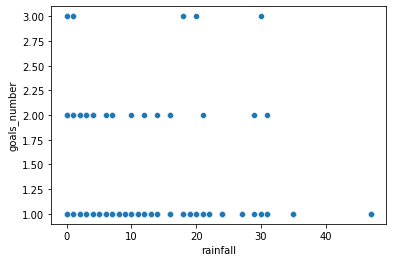

In [42]:
# nombre de buts marqués par match et par joueur (un point : nombre de buts marqués sur le même match par le même joueur)
plt.figure()
sns.scatterplot(x="rainfall", y="goals_number", data=df_player2_meteo)

<AxesSubplot:xlabel='rain', ylabel='goals_number'>

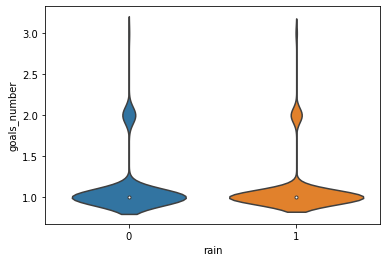

In [43]:
plt.figure()
sns.violinplot(y="goals_number", x="rain", data=df_player2_meteo)

<AxesSubplot:xlabel='goals_number', ylabel='rainfall'>

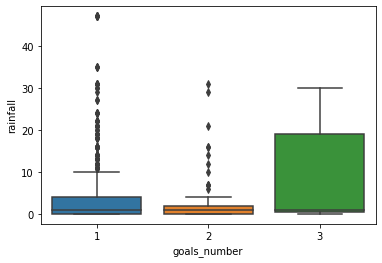

In [44]:
plt.figure()
sns.boxplot(x="goals_number", y="rainfall", data=df_player2_meteo)

Le nombre maximum de buts marqués par match pour 1 joueur est 3. 
On note une forte disparité des valeurs de cette modalité (886, 81, 7). Il est nécessaire de faire des classes pour rééquilibrer

<Figure size 432x288 with 0 Axes>

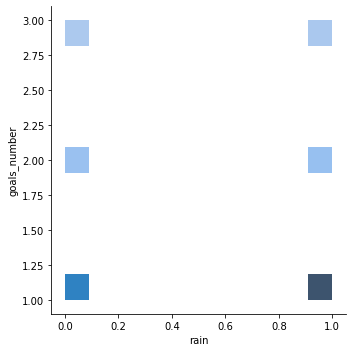

In [45]:
plt.figure()
sns.displot(y="goals_number", x="rain", data=df_player2_meteo)

/Users/marie/.pyenv/versions/3.9.5/envs/simplon/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


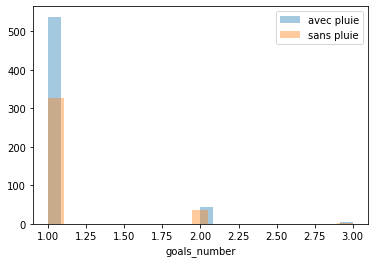

In [46]:
# distribution du nombre de buts selon la pluie (nombre total)
plt.figure()
sns.distplot(df_player2_rain["goals_number"], label="avec pluie", kde=False)
sns.distplot(df_player2_no_rain["goals_number"], label="sans pluie", kde=False)
plt.legend()

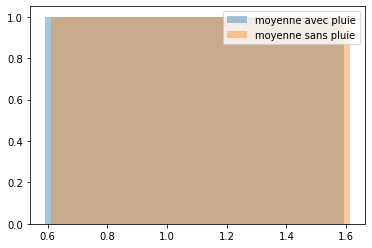

In [47]:
# distribution du nombre de buts selon la pluie (nombre moyen)
plt.figure()
sns.distplot(df_player2_rain["goals_number"].mean(), label="moyenne avec pluie", kde=False)
sns.distplot(df_player2_no_rain["goals_number"].mean(), label="moyenne sans pluie", kde=False)
plt.legend()

## Relation players - température

### Nombre buts marqués par joueur par match (par temp)

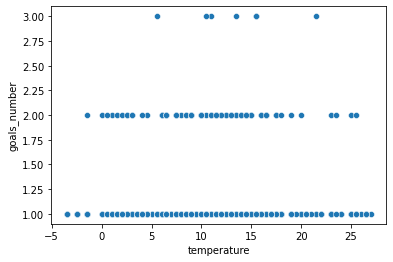

In [48]:
# Relation entre la température et le nombre de buts marqués par joueur par match
# on constate que le nombre de buts maximum par joueur semble augmenter quand la température est tempérée

plt.figure()
sns.scatterplot(x="temperature", y="goals_number", data=df_player2_meteo);

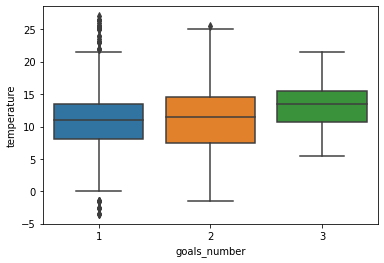

In [49]:
# Distribution du nombre de buts marqués par joueur par match
# On constate que les quantiles autour de la médiane se situent pour les 3 distributions entre 5 et 15°C. 

plt.figure()
sns.boxplot(x="goals_number", y="temperature", data=df_player2_meteo);

### Nombre buts moyen marqués par joueur et par match (par temp)

Note : les joueurs qui ne marquent pas de buts ne sont pas pris en compte. Pb ?

In [50]:
# nombre de buts moyen marqués par joueur et par match (en fonction de la température)
# interprétation : le nombre de buts moyen marqués par match pour un joueur pour une température de -3.5 est de 1.

goals_players_temperature = df_player2_meteo.groupby('temperature').mean()
goals_players_temperature

,matches_id,rainfall,goals_number,players_id,rain
temperature,,,,,
-3.5,821.000000,3.000000,1.000000,285.333333,1.000000
-2.5,823.000000,0.000000,1.000000,361.750000,0.000000
-1.5,805.285714,0.285714,1.142857,397.714286,0.285714
0.0,754.000000,1.000000,1.250000,137.750000,1.000000
0.5,768.000000,0.000000,1.333333,510.666667,0.000000
1.0,774.916667,1.666667,1.083333,367.250000,0.500000
1.5,811.571429,1.857143,1.071429,441.928571,0.428571
2.0,788.900000,4.400000,1.050000,258.700000,0.450000
2.5,745.285714,0.571429,1.285714,288.428571,0.285714


In [51]:
goals_players_temp_index_free = goals_players_temperature.reset_index()
goals_players_temp_index_free

,temperature,matches_id,rainfall,goals_number,players_id,rain
0,-3.5,821.000000,3.000000,1.000000,285.333333,1.000000
1,-2.5,823.000000,0.000000,1.000000,361.750000,0.000000
2,-1.5,805.285714,0.285714,1.142857,397.714286,0.285714
3,0.0,754.000000,1.000000,1.250000,137.750000,1.000000
4,0.5,768.000000,0.000000,1.333333,510.666667,0.000000
5,1.0,774.916667,1.666667,1.083333,367.250000,0.500000
6,1.5,811.571429,1.857143,1.071429,441.928571,0.428571
7,2.0,788.900000,4.400000,1.050000,258.700000,0.450000
8,2.5,745.285714,0.571429,1.285714,288.428571,0.285714
9,3.0,781.100000,1.700000,1.200000,302.500000,1.000000


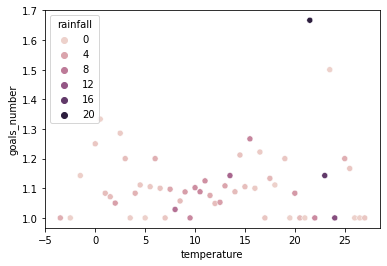

In [52]:
sns.scatterplot(data = goals_players_temp_index_free, x='temperature', y="goals_number", hue = "rainfall");

A priori, la température n'a que peu d'incidence sur le nombre moyen de buts marqués par joueur. Le résultat R2 ci-dessous le confirme. 

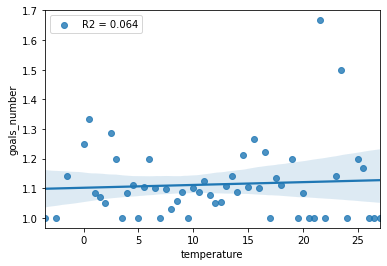

In [53]:
from scipy import stats
        
slope, intercept, r_value, pv, se = stats.linregress(goals_players_temp_index_free['temperature'],goals_players_temp_index_free['goals_number'])
sns.regplot(data = goals_players_temp_index_free, x='temperature', y="goals_number", label=f"R2 = {r_value.round(3)}").legend(loc="best");

In [54]:
# nombre de buts moyens marqués par match par joueur
# goals_number = pour id 589 -> 5 buts marqués par 3 joueurs différents => 1.66

# test_test = df_player2_meteo.groupby('matches_id').mean()
# test_test

### Nombre buts par joueur par match par intervalle de 2° de température

In [55]:
# Indexaion "temperature_classe" pour df_player2_meteo (nombre but total par joueur par match)

df_player2_meteo['temperature_classe'] = pd.cut(df_player2_meteo['temperature'], bins =[-3.5,-1.5,1.5,3.5,5.5,7.5,9.5,11.5,13.5,15.5,17.5,19.5,21.5,23.5,25.5,27], labels=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15'])
df_player2_meteo.head()

,matches_id,date,temperature,rainfall,goals_number,players_id,last_name,position,birthdate,nationality,rain,temperature_classe
0,589,2020-08-28 00:00:00,21.5,20.0,3,210,M. Depay,Att.,13/02/94,HOL,1,12
1,589,2020-08-28 00:00:00,21.5,20.0,1,606,W. Lautoa,Déf.,25/08/87,FRA,1,12
2,589,2020-08-28 00:00:00,21.5,20.0,1,630,A. Scheidler,Att.,04/06/98,FRA,1,12
3,590,2020-08-29 00:00:00,14.0,4.0,1,321,D. Le Tallec,Mil.,19/04/90,FRA,1,9
4,590,2020-08-29 00:00:00,14.0,4.0,1,329,G. Laborde,Att.,3/05/94,FRA,1,9


In [56]:
# Indexaion "temperature_classe" pour df_player_meteo (1 but = 1 joueur)


df_player_meteo['temperature_classe'] = pd.cut(df_player_meteo['temperature'], [-3.5,-1.5,1.5,3.5,5.5,7.5,9.5,11.5,13.5,15.5,17.5,19.5,21.5,23.5,25.5,27], labels=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15'])
df_player_meteo.head()

,matches_id,date,temperature,rainfall,players_id,last_name,position,birthdate,nationality,rain,temperature_classe
0,589,2020-08-28 00:00:00,21.5,20.0,210,M. Depay,Att.,13/02/94,HOL,1,12
1,589,2020-08-28 00:00:00,21.5,20.0,606,W. Lautoa,Déf.,25/08/87,FRA,1,12
2,589,2020-08-28 00:00:00,21.5,20.0,210,M. Depay,Att.,13/02/94,HOL,1,12
3,589,2020-08-28 00:00:00,21.5,20.0,210,M. Depay,Att.,13/02/94,HOL,1,12
4,589,2020-08-28 00:00:00,21.5,20.0,630,A. Scheidler,Att.,04/06/98,FRA,1,12


In [57]:
# masque booleen
df_player_meteo[df_player_meteo['players_id'] == 4]

,matches_id,date,temperature,rainfall,players_id,last_name,position,birthdate,nationality,rain,temperature_classe
159,645,2020-10-18 00:00:00,11.5,0.0,4,A. Bamba,Déf.,25/04/90,CIV,0,7
247,676,2020-11-08 00:00:00,15.5,1.0,4,A. Bamba,Déf.,25/04/90,CIV,1,9
653,825,2021-02-14 00:00:00,1.5,0.0,4,A. Bamba,Déf.,25/04/90,CIV,0,2


In [58]:
# Nombre de buts marqués par intervalle de température

goals_by_temp = df_player2_meteo.groupby(['temperature_classe']).count()
goals_by_temp

,matches_id,date,temperature,rainfall,goals_number,players_id,last_name,position,birthdate,nationality,rain
temperature_classe,,,,,,,,,,,
1,11,11,11,11,11,11,11,11,11,11,11
2,33,33,33,33,33,33,33,33,33,33,33
3,45,45,45,45,45,45,45,45,45,45,45
4,43,43,43,43,43,43,43,43,43,43,43
5,89,89,89,89,89,89,89,89,89,89,89
6,152,152,152,152,152,152,152,152,152,152,152
7,197,197,197,197,197,197,197,197,196,197,197
8,144,144,144,144,144,144,144,144,144,144,144
9,101,101,101,101,101,101,101,101,101,101,101


In [59]:
goals_by_temp_index = goals_by_temp.reset_index()
goals_by_temp_index

,temperature_classe,matches_id,date,temperature,rainfall,goals_number,players_id,last_name,position,birthdate,nationality,rain
0,1,11,11,11,11,11,11,11,11,11,11,11
1,2,33,33,33,33,33,33,33,33,33,33,33
2,3,45,45,45,45,45,45,45,45,45,45,45
3,4,43,43,43,43,43,43,43,43,43,43,43
4,5,89,89,89,89,89,89,89,89,89,89,89
5,6,152,152,152,152,152,152,152,152,152,152,152
6,7,197,197,197,197,197,197,197,197,196,197,197
7,8,144,144,144,144,144,144,144,144,144,144,144
8,9,101,101,101,101,101,101,101,101,101,101,101
9,10,69,69,69,69,69,69,69,69,69,69,69


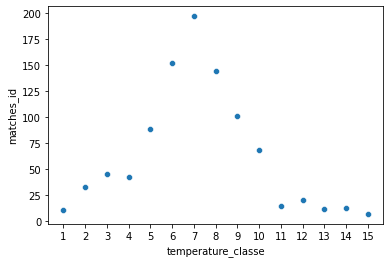

In [60]:
sns.scatterplot(data = goals_by_temp_index, x='temperature_classe', y="matches_id");

In [62]:
slope, intercept, r_value, pv, se = stats.linregress(goals_by_temp_index['temperature_classe'],goals_by_temp_index['players_id'])
sns.regplot(data = goals_by_temp_index, x='temperature_classe', y="players_id", label=f"R2 = {r_value.round(3)}").legend(loc="best");

TypeError: unsupported operand type(s) for /: 'str' and 'int'

### Nombre total de buts par joueur par classe de température intervalle de 2

In [91]:
# Nombre total de buts par joueur par classe de température (avec df_player_meteo)

pd.set_option('display.max_rows', 4500)
goals_player_by_temp = df_player_meteo.groupby(['temperature_classe', 'players_id']).count()
goals_player_by_temp

matches_id  date  temperature  rainfall  \
temperature_classe players_id                                            
1                  4                    0     0            0         0   
                   7                    0     0            0         0   
                   11                   0     0            0         0   
                   12                   0     0            0         0   
                   16                   0     0            0         0   
                   17                   0     0            0         0   
                   18                   0     0            0         0   
                   20                   0     0            0         0   
                   21                   0     0            0         0   
                   22                   0     0            0         0   
                   24                   0     0            0         0   
                   27                   0     0            0         0   
                   28                   0     0            0         0   
                   29                   0     0            0         0   
                   32                   0     0            0         0   
                   38                   0     0            0         0   
                   45                   0     0            0         0   
                   49                   0     0            0         0   
                   50                   0     0            0         0   
                   52                   0     0            0         0   
                   54                   0     0            0         0   
                   55                   0     0            0         0   
                   57                   0     0            0         0   
                   58                   0     0            0         0   
                   59                   0     0            0         0   
                   62                   0     0            0         0   
                   63                   0     0            0         0   
                   64                   0     0            0         0   
                   65                   0     0            0         0   
                   72                   0     0            0         0   
                   73                   0     0            0         0   
                   74                   0     0            0         0   
                   76                   0     0            0         0   
                   77                   0     0            0         0   
                   78                   0     0            0         0   
                   83                   0     0            0         0   
                   89                   0     0            0         0   
                   91                   0     0            0         0   
                   92                   0     0            0         0   
                   93                   0     0            0         0   
                   94                   0     0            0         0   
                   95                   0     0            0         0   
                   101                  0     0            0         0   
                   103                  0     0            0         0   
                   105                  0     0            0         0   
                   107                  0     0            0         0   
                   109                  0     0            0         0   
                   110                  0     0            0         0   
                   111                  0     0            0         0   
                   113                  0     0            0         0   
                   114                  0     0            0         0   
                   115                  0     0            0         0   
                   119             

In [92]:
goals_player_by_temp_index = goals_player_by_temp.reset_index()
goals_player_by_temp_index

,temperature_classe,players_id,matches_id,date,temperature,rainfall,last_name,position,birthdate,nationality,rain
0,1,4,0,0,0,0,0,0,0,0,0
1,1,7,0,0,0,0,0,0,0,0,0
2,1,11,0,0,0,0,0,0,0,0,0
3,1,12,0,0,0,0,0,0,0,0,0
4,1,16,0,0,0,0,0,0,0,0,0
5,1,17,0,0,0,0,0,0,0,0,0
6,1,18,0,0,0,0,0,0,0,0,0
7,1,20,0,0,0,0,0,0,0,0,0
8,1,21,0,0,0,0,0,0,0,0,0
9,1,22,0,0,0,0,0,0,0,0,0


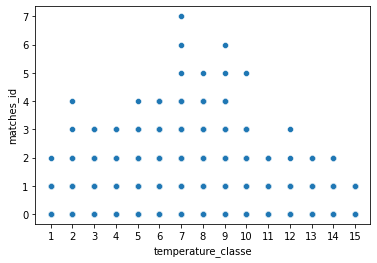

In [93]:
sns.scatterplot(data = goals_player_by_temp_index, x='temperature_classe', y="matches_id");

In [94]:
slope, intercept, r_value, pv, se = stats.linregress(goals_player_by_temp_index['temperature_classe'],goals_player_by_temp_index['matches_id'])
sns.regplot(data = goals_player_by_temp_index, x='temperature_classe', y="matches_id", label=f"R2 = {r_value.round(3)}").legend(loc="best");

TypeError: unsupported operand type(s) for /: 'str' and 'int'

###  Nombre total de buts par match par joueur par classe de température de 2

In [66]:
# Nombre total de buts par joueur par match par classe de température (avec df_player2_meteo)

pd.set_option('display.max_rows', 4500)
goals_player_by_temp_df2 = df_player2_meteo.groupby(['temperature_classe', 'players_id']).count()
goals_player_by_temp_df2

matches_id  date  temperature  rainfall  \
temperature_classe players_id                                            
1                  4                    0     0            0         0   
                   7                    0     0            0         0   
                   11                   0     0            0         0   
                   12                   0     0            0         0   
                   16                   0     0            0         0   
                   17                   0     0            0         0   
                   18                   0     0            0         0   
                   20                   0     0            0         0   
                   21                   0     0            0         0   
                   22                   0     0            0         0   
                   24                   0     0            0         0   
                   27                   0     0            0         0   
                   28                   0     0            0         0   
                   29                   0     0            0         0   
                   32                   0     0            0         0   
                   38                   0     0            0         0   
                   45                   0     0            0         0   
                   49                   0     0            0         0   
                   50                   0     0            0         0   
                   52                   0     0            0         0   
                   54                   0     0            0         0   
                   55                   0     0            0         0   
                   57                   0     0            0         0   
                   58                   0     0            0         0   
                   59                   0     0            0         0   
                   62                   0     0            0         0   
                   63                   0     0            0         0   
                   64                   0     0            0         0   
                   65                   0     0            0         0   
                   72                   0     0            0         0   
                   73                   0     0            0         0   
                   74                   0     0            0         0   
                   76                   0     0            0         0   
                   77                   0     0            0         0   
                   78                   0     0            0         0   
                   83                   0     0            0         0   
                   89                   0     0            0         0   
                   91                   0     0            0         0   
                   92                   0     0            0         0   
                   93                   0     0            0         0   
                   94                   0     0            0         0   
                   95                   0     0            0         0   
                   101                  0     0            0         0   
                   103                  0     0            0         0   
                   105                  0     0            0         0   
                   107                  0     0            0         0   
                   109                  0     0            0         0   
                   110                  0     0            0         0   
                   111                  0     0            0         0   
                   113                  0     0            0         0   
                   114                  0     0            0         0   
                   115                  0     0            0         0   
                   119             

In [67]:
goals_player_by_temp_df2_index = goals_player_by_temp_df2.reset_index()
goals_player_by_temp_df2_index

,temperature_classe,players_id,matches_id,date,temperature,rainfall,goals_number,last_name,position,birthdate,nationality,rain
0,1,4,0,0,0,0,0,0,0,0,0,0
1,1,7,0,0,0,0,0,0,0,0,0,0
2,1,11,0,0,0,0,0,0,0,0,0,0
3,1,12,0,0,0,0,0,0,0,0,0,0
4,1,16,0,0,0,0,0,0,0,0,0,0
5,1,17,0,0,0,0,0,0,0,0,0,0
6,1,18,0,0,0,0,0,0,0,0,0,0
7,1,20,0,0,0,0,0,0,0,0,0,0
8,1,21,0,0,0,0,0,0,0,0,0,0
9,1,22,0,0,0,0,0,0,0,0,0,0


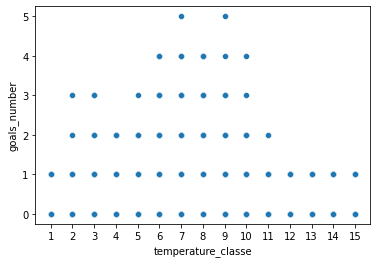

In [68]:
sns.scatterplot(data = goals_player_by_temp_df2_index, x='temperature_classe', y="goals_number");

### Nombre moyen de buts marqués par match par intervalle de température de 2

In [69]:
goals_player_mean_by_temp = df_player2_meteo.groupby(['temperature_classe', 'players_id']).mean()
goals_player_mean_by_temp

matches_id  temperature   rainfall  \
temperature_classe players_id                                       
1                  4                  NaN          NaN        NaN   
                   7                  NaN          NaN        NaN   
                   11                 NaN          NaN        NaN   
                   12                 NaN          NaN        NaN   
                   16                 NaN          NaN        NaN   
                   17                 NaN          NaN        NaN   
                   18                 NaN          NaN        NaN   
                   20                 NaN          NaN        NaN   
                   21                 NaN          NaN        NaN   
                   22                 NaN          NaN        NaN   
                   24                 NaN          NaN        NaN   
                   27                 NaN          NaN        NaN   
                   28                 NaN          NaN        NaN   
                   29                 NaN          NaN        NaN   
                   32                 NaN          NaN        NaN   
                   38                 NaN          NaN        NaN   
                   45                 NaN          NaN        NaN   
                   49                 NaN          NaN        NaN   
                   50                 NaN          NaN        NaN   
                   52                 NaN          NaN        NaN   
                   54                 NaN          NaN        NaN   
                   55                 NaN          NaN        NaN   
                   57                 NaN          NaN        NaN   
                   58                 NaN          NaN        NaN   
                   59                 NaN          NaN        NaN   
                   62                 NaN          NaN        NaN   
                   63                 NaN          NaN        NaN   
                   64                 NaN          NaN        NaN   
                   65                 NaN          NaN        NaN   
                   72                 NaN          NaN        NaN   
                   73                 NaN          NaN        NaN   
                   74                 NaN          NaN        NaN   
                   76                 NaN          NaN        NaN   
                   77                 NaN          NaN        NaN   
                   78                 NaN          NaN        NaN   
                   83                 NaN          NaN        NaN   
                   89                 NaN          NaN        NaN   
                   91                 NaN          NaN        NaN   
                   92                 NaN          NaN        NaN   
                   93                 NaN          NaN        NaN   
                   94                 NaN          NaN        NaN   
                   95                 NaN          NaN        NaN   
                   101                NaN          NaN        NaN   
                   103                NaN          NaN        NaN   
                   105                NaN          NaN        NaN   
                   107                NaN          NaN        NaN   
                   109                NaN          NaN        NaN   
                   110                NaN          NaN        NaN   
                   111                NaN          NaN        NaN   
                   113                NaN          NaN        NaN   
                   114                NaN          NaN        NaN   
                   115                NaN          NaN        NaN   
                   119                NaN          NaN        NaN   
                   121                NaN          NaN        NaN   
                   122                NaN          NaN        NaN   
                   123                NaN          NaN        NaN   
                   124       

In [70]:
goals_player_mean_by_temp = goals_player_mean_by_temp.reset_index()
goals_player_mean_by_temp

,temperature_classe,players_id,matches_id,temperature,rainfall,goals_number,rain
0,1,4,NaN,NaN,NaN,NaN,NaN
1,1,7,NaN,NaN,NaN,NaN,NaN
2,1,11,NaN,NaN,NaN,NaN,NaN
3,1,12,NaN,NaN,NaN,NaN,NaN
4,1,16,NaN,NaN,NaN,NaN,NaN
5,1,17,NaN,NaN,NaN,NaN,NaN
6,1,18,NaN,NaN,NaN,NaN,NaN
7,1,20,NaN,NaN,NaN,NaN,NaN
8,1,21,NaN,NaN,NaN,NaN,NaN
9,1,22,NaN,NaN,NaN,NaN,NaN


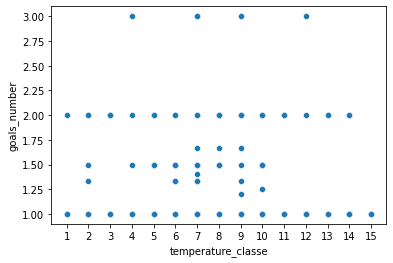

In [71]:
sns.scatterplot(data = goals_player_mean_by_temp, x='temperature_classe', y="goals_number");

In [72]:
slope, intercept, r_value, pv, se = stats.linregress(goals_player_mean_by_temp['temperature_classe'],goals_player_mean_by_temp['goals_number'])
sns.regplot(data = goals_player_mean_by_temp, x='temperature_classe', y="goals_number", label=f"R2 = {r_value.round(3)}").legend(loc="best");

TypeError: unsupported operand type(s) for /: 'str' and 'int'

### Nombre moyen de buts marqués par intervalle de température de 2

A revoir pour la moyenne !!! Créer une nouvelle colonne avec les valeurs de matches_id ?

In [73]:
goals_player_mean_by_temp_2 = df_player_meteo.groupby(['temperature_classe', 'players_id']).count()
goals_player_mean_by_temp_2

matches_id  date  temperature  rainfall  \
temperature_classe players_id                                            
1                  4                    0     0            0         0   
                   7                    0     0            0         0   
                   11                   0     0            0         0   
                   12                   0     0            0         0   
                   16                   0     0            0         0   
                   17                   0     0            0         0   
                   18                   0     0            0         0   
                   20                   0     0            0         0   
                   21                   0     0            0         0   
                   22                   0     0            0         0   
                   24                   0     0            0         0   
                   27                   0     0            0         0   
                   28                   0     0            0         0   
                   29                   0     0            0         0   
                   32                   0     0            0         0   
                   38                   0     0            0         0   
                   45                   0     0            0         0   
                   49                   0     0            0         0   
                   50                   0     0            0         0   
                   52                   0     0            0         0   
                   54                   0     0            0         0   
                   55                   0     0            0         0   
                   57                   0     0            0         0   
                   58                   0     0            0         0   
                   59                   0     0            0         0   
                   62                   0     0            0         0   
                   63                   0     0            0         0   
                   64                   0     0            0         0   
                   65                   0     0            0         0   
                   72                   0     0            0         0   
                   73                   0     0            0         0   
                   74                   0     0            0         0   
                   76                   0     0            0         0   
                   77                   0     0            0         0   
                   78                   0     0            0         0   
                   83                   0     0            0         0   
                   89                   0     0            0         0   
                   91                   0     0            0         0   
                   92                   0     0            0         0   
                   93                   0     0            0         0   
                   94                   0     0            0         0   
                   95                   0     0            0         0   
                   101                  0     0            0         0   
                   103                  0     0            0         0   
                   105                  0     0            0         0   
                   107                  0     0            0         0   
                   109                  0     0            0         0   
                   110                  0     0            0         0   
                   111                  0     0            0         0   
                   113                  0     0            0         0   
                   114                  0     0            0         0   
                   115                  0     0            0         0   
                   119             

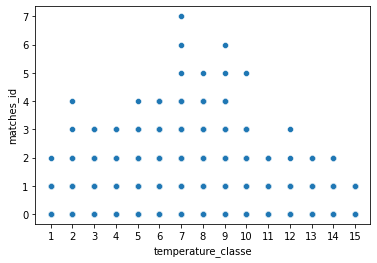

In [74]:
sns.scatterplot(data = goals_player_mean_by_temp_2, x='temperature_classe', y="matches_id");

# Prolongements et améliorations :
- Poursuivre le travail sur les classes de températures, avec 3 intervalles (froid, tempéré, chaud)
- Analyse temporelle à réaliser pour identifier des schémas (hypothèse sous-jecente : fatigue accrue des joueurs en fin de saison, manque d'entrainement en début de saison). Nécessité de travailler sur plusieurs années pour être fiable.
- Accroitre le champ de l'étude pour confirmer la relation avec la température en allant chercher les données des années précédentes
- Affiner les données en termes de météo (plus de données, précision plus fine au niveau des horaires)
- Elargir le champ de recherche des facteurs pouvant expliquer le dynamisme d'un match
